In [1]:
# Spatial analysis
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import mapclassify as mc
import folium

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
sns.set()
sns.set_style('white')

In [2]:
# Read shapefile into GeoDF
world_data = gpd.read_file('../data/world/world.shp')
world_data.head()

,FIPS,ISO2,ISO3,UN,NAME,AREA,POP2005,REGION,SUBREGION,LON,LAT,geometry
0,AC,AG,ATG,28,Antigua and Barbuda,44,83039,19,29,-61.783,17.078,"MULTIPOLYGON (((-61.68667 17.02444, -61.73806 ..."
1,AG,DZ,DZA,12,Algeria,238174,32854159,2,15,2.632,28.163,"POLYGON ((2.96361 36.80222, 2.98139 36.80694, ..."
2,AJ,AZ,AZE,31,Azerbaijan,8260,8352021,142,145,47.395,40.430,"MULTIPOLYGON (((45.08332 39.76804, 45.26639 39..."
3,AL,AL,ALB,8,Albania,2740,3153731,150,39,20.068,41.143,"POLYGON ((19.43621 41.02107, 19.45055 41.06000..."
4,AM,AM,ARM,51,Armenia,2820,3017661,142,145,44.563,40.534,"MULTIPOLYGON (((45.57305 40.63249, 45.52888 40..."


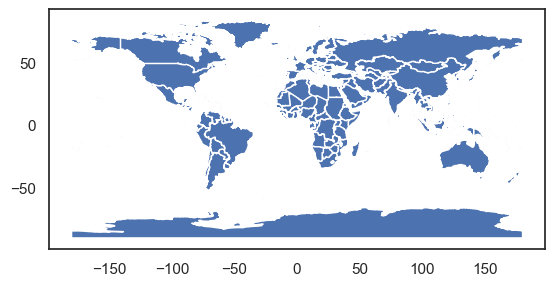

In [3]:
# Plot GeoDF
world_data.plot()
plt.show()

In [4]:
# Create an interactive map
world_data[['NAME', 'AREA', 'LON', 'LAT', 'geometry']].explore()

In [5]:
# Calculate the area of each country
world_data['area'] = world_data.area
# Convert areas into Sq. Km.
world_data['area'].apply(lambda x: x / 1000000)
# Print descriptive statistics
world_data['area'].describe()

/var/folders/db/m3svjh3n4blf_t2qj_sc01lw0000gp/T/ipykernel_49126/1473403218.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  world_data['area'] = world_data.area


count     246.000000
mean       87.069126
std       453.258196
min         0.000034
25%         0.134920
50%         6.614980
75%        37.960559
max      6032.957367
Name: area, dtype: float64

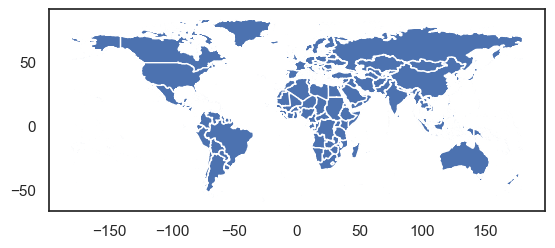

In [6]:
# Remove a continent (Antarctica) from GeoDF
world_data = world_data[world_data['NAME'] != 'Antarctica']
# Visualize new GeoDF
world_data.plot()
plt.show()

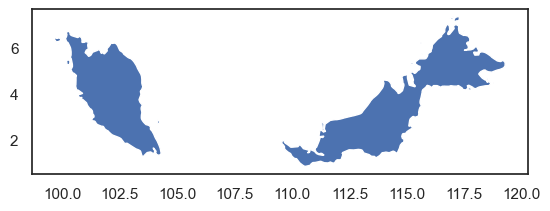

In [7]:
# Visualize specific country (Malaysia)
world_data[world_data['NAME'] == 'Malaysia'].plot()
plt.show()

In [8]:
# Check current coordinate system
world_data.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

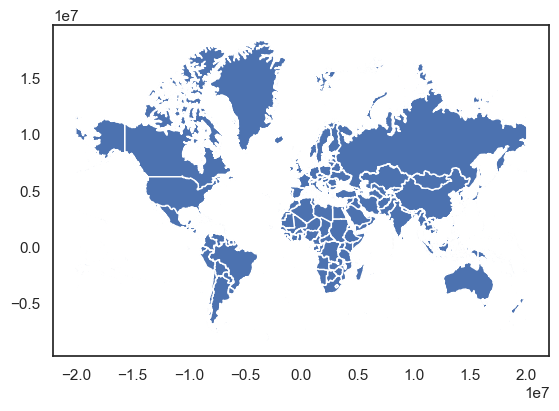

In [9]:
# Save current coordinate system (WGS 84, EPSG code: 4326)
current_crs = world_data.crs
# Transform coordinates using different projection (EPSG code: 3857)
world_data.to_crs(epsg=3857, inplace=True)
# Visualize results
world_data.plot()
plt.show()

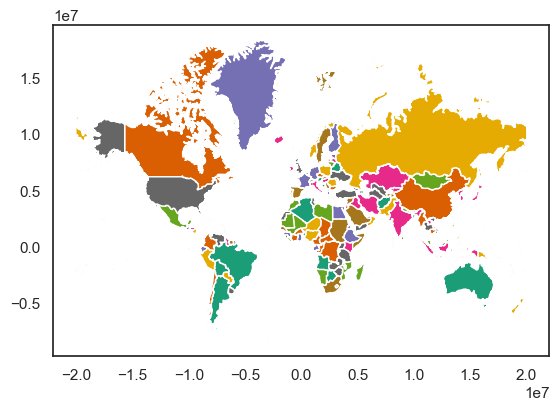

In [10]:
# Fill color using cmap, grouped by country
world_data.plot(column='NAME', cmap='Dark2')
plt.show()

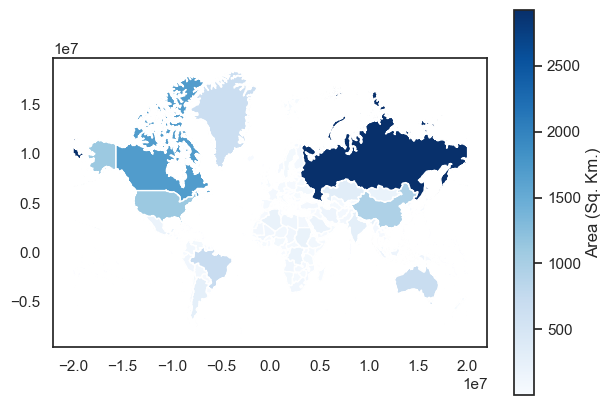

In [11]:
# Fill color using cmap, this time grouped by area; add color bar as legend
world_data.plot(column='area', cmap='Blues', legend=True, legend_kwds={'label': 'Area (Sq. Km.)'}, figsize=(7, 5))
plt.show()

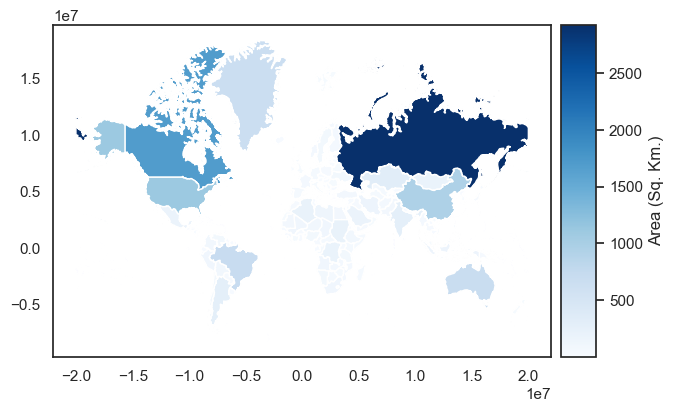

In [12]:
# Repeat previous plot but resize legend
fig, ax = plt.subplots(figsize=(7, 5))
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='7%', pad=0.1)
world_data.plot(column='area', cmap='Blues', legend=True, legend_kwds={'label': 'Area (Sq. Km.)'}, ax=ax, cax=cax)
plt.show()

There are several sample datasets that come with the GeoPlot library:

- usa_cities
- contiguous_usa
- nyc_collision_factors
- nyc_boroughs
- ny_census
- obesity_by_state
- la_flights
- dc_roads
- nyc_map_pluto_sample
- nyc_collisions_sample
- boston_zip_codes
- boston_airbnb_listings
- napoleon_troop_movements
- nyc_fatal_collisions
- nyc_injurious_collisions
- nyc_police_precincts
- nyc_parking_tickets
- world
- melbourne
- melbourne_schools
- san_francisco
- san_francisco_street_trees_sample
- california_congressional_districts

We can also use our own datasets by editing the `datasets.py` file ([example datasets](https://un-mapped.carto.com/datasets)).

Note, 
- Polygonal data -> `polyplot()`
- Point data -> `pointplot()`

In [13]:
# Load world shapefile data
world_path = gplt.datasets.get_path('world')
# Read from path into GeoDF
world = gpd.read_file(world_path)
world.head()

,id,name,geometry
0,AFG,Afghanistan,"POLYGON ((61.21082 35.65007, 62.23065 35.27066..."
1,AGO,Angola,"MULTIPOLYGON (((16.32653 -5.87747, 16.57318 -6..."
2,ALB,Albania,"POLYGON ((20.59025 41.85540, 20.46317 41.51509..."
3,ARE,United Arab Emirates,"POLYGON ((51.57952 24.24550, 51.75744 24.29407..."
4,ARG,Argentina,"MULTIPOLYGON (((-65.50000 -55.20000, -66.45000..."


/Users/zach/opt/miniconda3/envs/Geo-Sandbox/lib/python3.9/site-packages/geoplot/geoplot.py:885: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for subgeom in geom:


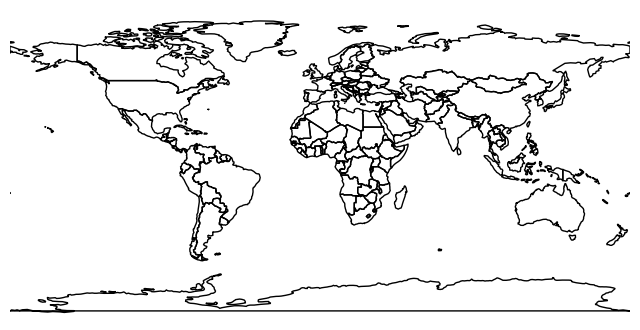

In [14]:
# Plot GeoDF
gplt.polyplot(world)
plt.show()

In [15]:
# Read contiguous_usa & usa_cities shapefiles
usa_path, cities_path = gplt.datasets.get_path('contiguous_usa'), gplt.datasets.get_path('usa_cities')
contiguous_usa, usa_cities = gpd.read_file(usa_path), gpd.read_file(cities_path)
contiguous_usa.head()

,state,adm1_code,population,geometry
0,Minnesota,USA-3514,5303925,"POLYGON ((-89.59941 48.01027, -89.48888 48.013..."
1,Montana,USA-3515,989415,"POLYGON ((-111.19419 44.56116, -111.29155 44.7..."
2,North Dakota,USA-3516,672591,"POLYGON ((-96.60136 46.35136, -96.53891 46.199..."
3,Idaho,USA-3518,1567582,"POLYGON ((-111.04973 44.48816, -111.05025 42.0..."
4,Washington,USA-3519,6724540,"POLYGON ((-116.99807 46.33017, -116.90653 46.1..."


In [16]:
usa_cities.head()

,id,POP_2010,ELEV_IN_FT,STATE,geometry
0,53,40888.0,1611.0,ND,POINT (-101.29627 48.23251)
1,101,52838.0,830.0,ND,POINT (-97.03285 47.92526)
2,153,15427.0,1407.0,ND,POINT (-98.70844 46.91054)
3,177,105549.0,902.0,ND,POINT (-96.78980 46.87719)
4,192,17787.0,2411.0,ND,POINT (-102.78962 46.87918)


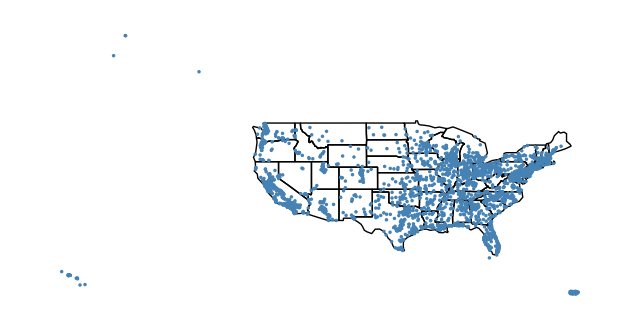

In [17]:
# Overplot poly & point plots
ax = gplt.polyplot(contiguous_usa)
gplt.pointplot(usa_cities, s=1.5, ax=ax)
plt.show()

In [18]:
# Read melbourne & melbourne_schools shapefiles
melbourne_path, schools_path = gplt.datasets.get_path('melbourne'), gplt.datasets.get_path('melbourne_schools')
melbourne, melbourne_schools = gpd.read_file(melbourne_path), gpd.read_file(schools_path)
melbourne.head()

,name,boundary,geometry
0,Greater Melbourne,administrative,"POLYGON ((144.44405 -37.86413, 144.44898 -37.8..."


In [19]:
melbourne_schools.head()

,Education_Sector,School_No,School_Name,School_Type,School_Status,Address_Line_1,Address_Line_2,Address_Town,Address_State,Address_Postcode,Postal_Address_Line_1,Postal_Address_Line_2,Postal_Town,Postal_State,Postal_Postcode,Full_Phone_No,LGA_ID,LGA_Name,geometry
0,Government,12,Warrandyte Primary School,Primary,O,5-11 Forbes Street,NaN,Warrandyte,VIC,3113,5-11 Forbes Street,NaN,WARRANDYTE,VIC,3113,03 9844 3537,421,Manningham (C),POINT (145.21398 -37.74267)
1,Government,40,Berwick Primary School,Primary,O,37 Fairholme Boulevard,NaN,Berwick,VIC,3806,37 Fairholme Boulevard,NaN,Berwick,VIC,3806,03 9707 1026,161,Casey (C),POINT (145.35374 -38.04418)
2,Government,84,Cheltenham Primary School,Primary,O,231 Charman Road,NaN,Cheltenham,VIC,3192,231 Charman Road,NaN,CHELTENHAM,VIC,3192,03 8585 3200,91,Bayside (C),POINT (145.05463 -37.96861)
3,Government,113,Newport Lakes Primary School,Primary,O,Elizabeth Street,NaN,Newport,VIC,3015,Elizabeth Street,NaN,NEWPORT,VIC,3015,03 9391 8942,311,Hobsons Bay (C),POINT (144.87834 -37.83842)
4,Government,128,St Andrews Primary School,Primary,O,Caledonia Street,NaN,St Andrews,VIC,3761,Caledonia Street,NaN,ST ANDREWS,VIC,3761,03 9710 1255,571,Nillumbik (S),POINT (145.26983 -37.60232)


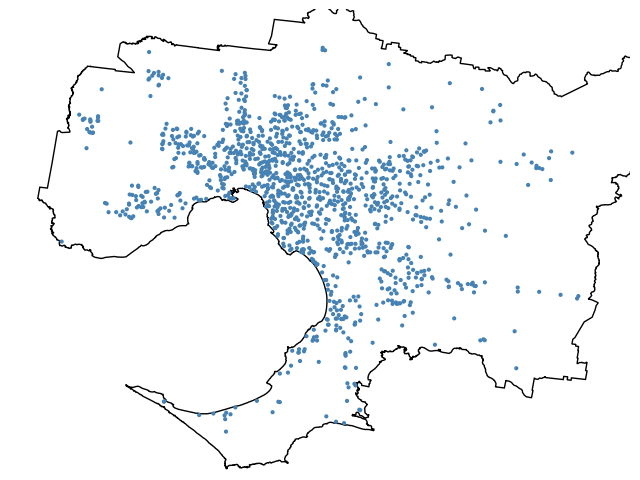

In [20]:
# Overplot poly & point plots
ax = gplt.polyplot(melbourne)
gplt.pointplot(melbourne_schools, s=2, ax=ax)
plt.show()

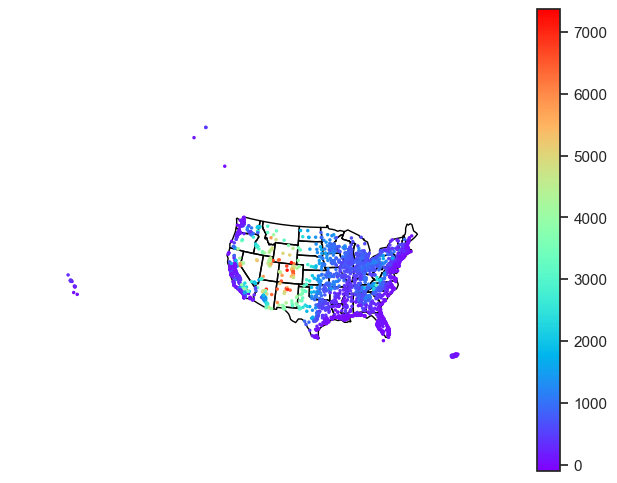

In [21]:
# Repeat previous plot of contiguous_usa & usa_cities, but using Albers equal-area projection
ax = gplt.polyplot(contiguous_usa, projection=gcrs.AlbersEqualArea())
# Also apply cmap as a function of elevation in feet
gplt.pointplot(usa_cities, s=1.5, hue='ELEV_IN_FT', cmap='rainbow', legend=True, ax=ax)
plt.show()

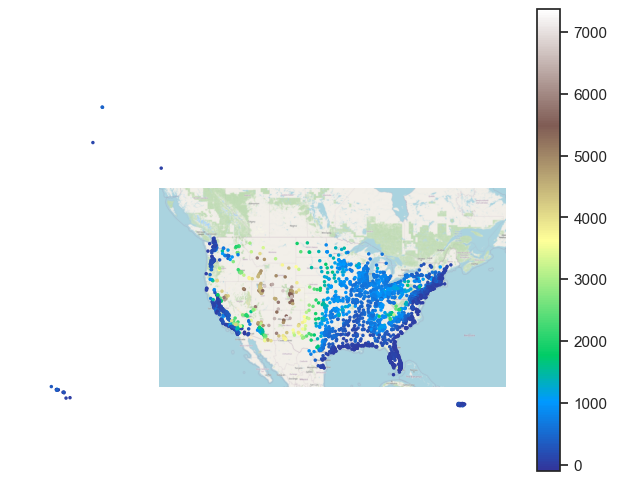

In [22]:
# Repeat previous plot of contiguous_usa & usa_cities, but using WebMercator projection
ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator())
# Also apply cmap as a function of elevation in feet
gplt.pointplot(usa_cities, s=1.5, hue='ELEV_IN_FT', cmap='terrain', legend=True, ax=ax)
plt.show()

A choropleth takes data that has been aggregated on some meaningful polygonal level and uses color to communicate it to the reader. It’s a well-known plot type, and it’s perhaps the most general-purpose and well-known of the spatial plot types. 

In [23]:
# Read nyc_boroughs shapefile from path
nyc_boroughs = gpd.read_file(gplt.datasets.get_path('nyc_boroughs'))
nyc_boroughs.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330385.03697,1.623853e+09,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,4,Queens,861038.47930,3.049947e+09,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
2,3,Brooklyn,726568.94634,1.959432e+09,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,1,Manhattan,358532.95642,6.364422e+08,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,2,Bronx,464517.89055,1.186804e+09,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."


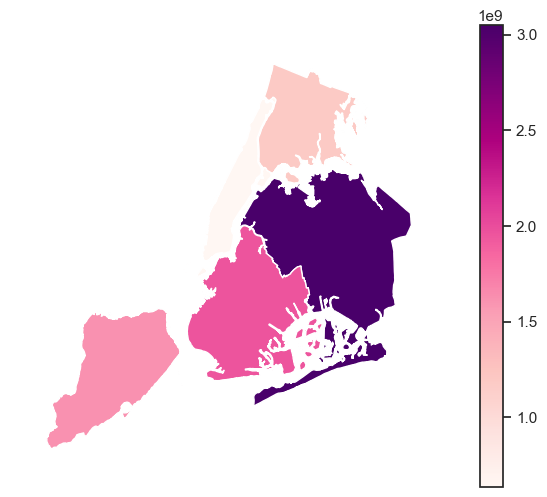

In [24]:
# Make choropleth map with Albers equal-area projection and cmap as a function of area
gplt.choropleth(nyc_boroughs, hue='Shape_Area', projection=gcrs.AlbersEqualArea(), cmap='RdPu', legend=True)
plt.show()

To specify a categorical color map, use a scheme. Also use mapclassify for Choropleth map classification.

/Users/zach/opt/miniconda3/envs/Geo-Sandbox/lib/python3.9/site-packages/mapclassify/classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


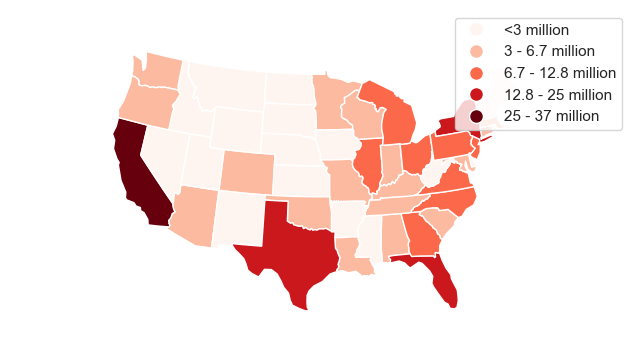

In [25]:
# Specify scheme for categorical color map with 5 classes as a function of population
scheme = mc.FisherJenks(contiguous_usa['population'], k=5)
# Make choropleth map with Albers equal-area projection, cmap as a function of population, and custom legend labels
gplt.choropleth(
	contiguous_usa, 
    hue='population', 
    projection=gcrs.AlbersEqualArea(),
	edgecolor='white', 
    linewidth=1,
	cmap='Reds', 
    legend=True, 
    legend_kwargs={'loc': 'best'},
	scheme=scheme, 
    legend_labels=[
    	'<3 million', 
        '3 - 6.7 million', 
        '6.7 - 12.8 million',
		'12.8 - 25 million', 
        '25 - 37 million'
	]
)
plt.show()

Kernel density estimation (KDE) is a technique that non-parametrically estimates a distribution function for a set of point observations without using parameters. KDEs are a popular method for examining data distributions; here, we apply the technique to a geospatial scenario.

In [26]:
# Read nyc_collision_factors shapefile from path
collisions = gpd.read_file(gplt.datasets.get_path('nyc_collision_factors'))
collisions.head()

,id,ON STREET NAME,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 3,NUMBER OF CYCLIST INJURED,LONGITUDE,OFF STREET NAME,VEHICLE TYPE CODE 4,LATITUDE,LOCATION,...,ZIP CODE,VEHICLE TYPE CODE 3,NUMBER OF CYCLIST KILLED,DATE,UNIQUE KEY,CONTRIBUTING FACTOR VEHICLE 5,VEHICLE TYPE CODE 5,TIME,NUMBER OF PEDESTRIANS INJURED,geometry
0,18,WORTMAN AVENUE,0,NaN,0,-73.872007,NaN,NaN,40.662514,"(40.6625139, -73.8720068)",...,11208.0,NaN,0,11/10/2016,3559576,NaN,NaN,16:11:00,0,POINT (-73.87201 40.66251)
1,21,HUBERT STREET,0,NaN,0,-74.008344,NaN,NaN,40.721323,"(40.7213228, -74.0083444)",...,10013.0,NaN,0,11/10/2016,3557391,NaN,NaN,05:11:00,1,POINT (-74.00834 40.72132)
2,69,HENRY STREET,0,NaN,0,-73.997563,NaN,NaN,40.687999,"(40.6879989, -73.9975625)",...,11201.0,NaN,0,04/16/2016,3419378,NaN,NaN,09:15:00,0,POINT (-73.99756 40.68800)
3,80,NaN,0,Failure to Yield Right-of-Way,0,-73.854542,67-64 FLEET STREET,NaN,40.719228,"(40.7192276, -73.8545422)",...,11375.0,PASSENGER VEHICLE,0,04/15/2016,3428072,NaN,NaN,10:20:00,0,POINT (-73.85454 40.71923)
4,85,BEDFORD AVENUE,0,NaN,0,-73.952731,NaN,NaN,40.632147,"(40.6321467, -73.9527315)",...,11210.0,NaN,0,04/15/2016,3417537,NaN,NaN,10:35:00,0,POINT (-73.95273 40.63215)


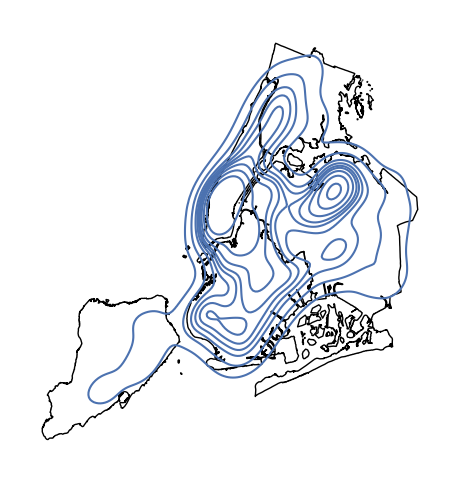

In [27]:
# Plot nyc_boroughs using Albers equal-area projection
ax = gplt.polyplot(nyc_boroughs, projection=gcrs.AlbersEqualArea())
# Overplot nyc_collision_factors as KDE
gplt.kdeplot(collisions, ax=ax)
plt.show()

A Sankey diagram depicts the flow of information through a network. It’s useful for displaying the magnitudes of data flowing through a system. Here we place the Sankey diagram in a geospatial context, making it helpful for monitoring traffic loads on a road network or travel volumes between airports, for example.

In [28]:
# Read la_flights shapefile from path
la_flights = gpd.read_file(gplt.datasets.get_path('la_flights'))
la_flights.head()

,id,Destination,Origin,Passengers,geometry
0,3,"San Francisco, CA","Los Angeles, CA",1863155,"MULTIPOINT (-118.24370 34.05220, -122.41942 37..."
1,5,"New York, NY","Los Angeles, CA",1698805,"MULTIPOINT (-118.24370 34.05220, -74.00552 40...."
2,7,"Chicago, IL","Los Angeles, CA",1600612,"MULTIPOINT (-118.24370 34.05220, -87.62980 41...."
3,31,"Las Vegas, NV","Los Angeles, CA",1244407,"MULTIPOINT (-118.24370 34.05220, -115.13983 36..."
4,40,"Dallas/Fort Worth, TX","Los Angeles, CA",1164625,"MULTIPOINT (-118.24370 34.05220, -97.04034 32...."


/Users/zach/opt/miniconda3/envs/Geo-Sandbox/lib/python3.9/site-packages/geoplot/geoplot.py:248: UserWarning: Please specify "legend_var" explicitly when both "hue" and "scale" are specified. Defaulting to "legend_var='hue'".
  warnings.warn(
/Users/zach/opt/miniconda3/envs/Geo-Sandbox/lib/python3.9/site-packages/geoplot/geoplot.py:1427: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return shapely.geometry.LineString(geom)
/Users/zach/opt/miniconda3/envs/Geo-Sandbox/lib/python3.9/site-packages/shapely/geometry/linestring.py:46: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  ret = geos_linestring_from_py(coordinates)


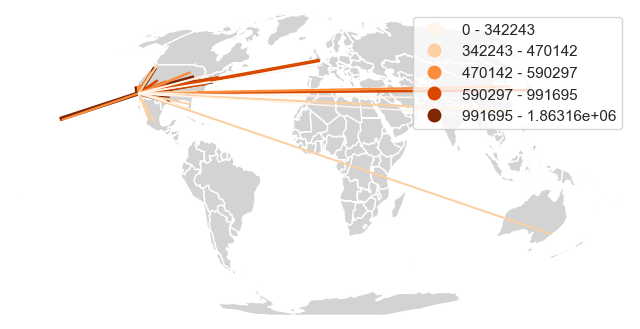

In [29]:
# Specify scheme for categorical color map with 5 classes as a function of the number of passengers
scheme = mc.Quantiles(la_flights['Passengers'], k=5)
# Make la_flights sankey plot using Mollweide projection, and cmap as a function of the number of passengers
ax = gplt.sankey(la_flights, projection=gcrs.Mollweide(), scale='Passengers', hue='Passengers', scheme=scheme, cmap='Oranges', legend=True)
# Overplot world GeoDF
gplt.polyplot(world, facecolor='lightgray', edgecolor='white', ax=ax)
ax.set_global()
plt.show()

In [30]:
# Define coordinates for where we want to center our map (center of east Malaysia)
msia_coords = [4.2105, 101.9758]
# Create the interactive map
msia_map = folium.Map(location=msia_coords, zoom_start=7)
msia_map

In [31]:
# Define marker coordinates for POIs
KL_coords = [3.140853, 101.693207]
klang_coords = [3.0449, 101.4456]
putrajaya_coords = [2.9264, 101.6964]

# Add markers to the map
folium.Marker(KL_coords, popup='Kuala Lumpur').add_to(msia_map)
folium.Marker(klang_coords, popup='Klang').add_to(msia_map)
folium.Marker(putrajaya_coords, popup='Putrajaya').add_to(msia_map)

# Display the map
msia_map

In [32]:
# Add tileset to map
msia_map_with_tiles = folium.Map(location=[2.7105, 101.9758], tiles='Stamen Toner', zoom_start=8)

# Add markers
folium.Marker(KL_coords, popup='Kuala Lumpur').add_to(msia_map_with_tiles)
folium.Marker(klang_coords, popup='Klang').add_to(msia_map_with_tiles)
folium.Marker(putrajaya_coords, popup='Putrajaya').add_to(msia_map_with_tiles)

msia_map_with_tiles

In [33]:
# Repeat previous map, but use colored polygon markers instead of default markers
msia_map_with_tiles = folium.Map(location=[2.7105, 101.9758], tiles='Stamen Toner', zoom_start=8)

folium.RegularPolygonMarker(KL_coords, popup='Kuala Lumpur', fill_color='#00ff40', number_of_sides=3, radius=15).add_to(msia_map_with_tiles)
folium.RegularPolygonMarker(klang_coords, popup='Klang', fill_color='#bf00ff', number_of_sides=5, radius=15).add_to(msia_map_with_tiles)
folium.RegularPolygonMarker(putrajaya_coords, popup='Putrajaya', fill_color='#ff0000', number_of_sides=8, radius=15).add_to(msia_map_with_tiles)

msia_map_with_tiles

Source: [https://www.geeksforgeeks.org/working-with-geospatial-data-in-python/](https://www.geeksforgeeks.org/working-with-geospatial-data-in-python/)

Source: [https://sustainability-gis.readthedocs.io/en/latest/lessons/L1/intro-to-python-geostack.html](https://sustainability-gis.readthedocs.io/en/latest/lessons/L1/intro-to-python-geostack.html)

Source: [https://www.earthdatascience.org/tutorials/introduction-to-leaflet-animated-maps/](https://www.earthdatascience.org/tutorials/introduction-to-leaflet-animated-maps/)